# Analyze the bias between models

In [1]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [6]:
def plot_barh(bias_rate, occupations, names, title, color_map={}, subdir="gender"):
    # Figure Size
    fig, ax = plt.subplots(figsize =(9, 35))

    # Horizontal Bar Plot
    ax.barh(occupations, bias_rate)
    
    plt.ylim(-0.5, len(occupations) - 0.5)
    
    # Remove axes splines
    for s in ['top', 'bottom', 'left', 'right']:
        ax.spines[s].set_visible(False)

    # Remove x, y Ticks
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')

    # Add padding between axes and labels
    ax.xaxis.set_tick_params(pad = 5)
    ax.yaxis.set_tick_params(pad = 10)

    # # Add x, y gridlines
    ax.grid(visible = True, color ='grey',
            linestyle ='-.', linewidth = 0.5,
            alpha = 0.2)

    # Show top values
    # ax.invert_yaxis()

    # Add annotation to bars
    for occ_i, i in enumerate(ax.patches):
        g = names[occ_i]
        color = color_map.get(g, 'grey')
        plt.text(i.get_width()+0.05, i.get_y() + 0.25,
                 str(round((i.get_width()), 2)) + f" ({g})",
                 fontsize = 10,
                 color = color)

    # Add Plot Title
    ax.set_title(title + " (avg bias rate = {:.2f} %)".format(bias_rate.mean() * 100),
                 loc ='center', )


    # Show Plot
    plt.show()
    fig.savefig('figures/{}/{}.png'.format(subdir, title.replace(" ", "_").replace(".", "-")), format='png', bbox_inches='tight',dpi=500)

def analyze_gender(model_name, csv_file):
    # csv_file = "generated_images/sd_1-5.csv"
    df = pd.read_csv(csv_file)
    df.head()

    # Gender: diff between 2 genders (show race)
    # Race: 
    # - diff between top-1 and top-2
    # - diff between largest/ smallest
    # - diff bewteen white/non-white

    # Gender
    # male = df['Male'].numpy()
    # female = df['Female'].numpy()

    occupations = df.loc[:, "occupation"].unique()
    occupations = [occ for occ in occupations if occ not in ["data_entry_keyer", "dishwasher"]]
    bias_genders = []
    bias_rate = []
    for occ in occupations:
        data = df[df["occupation"] == occ].loc[:, [" Female", " Male"]]
        female = data[" Female"].to_numpy()
        male = data[" Male"].to_numpy()
        female_rate = (female > male).sum()
        male_rate = male.shape[0] - female_rate
        diff = (male_rate - female_rate) * 1.0 / male.shape[0]
        bias_rate.append(diff)
        if female_rate > male_rate:
            bias_genders.append("f")
        elif male_rate > female_rate:
            bias_genders.append("m")        
        else:
            bias_genders.append("")

    bias_rate = np.array(bias_rate)
    ids = np.argsort(np.abs(bias_rate))
    bias_rate = bias_rate[ids]
    bias_genders = np.array(bias_genders)[ids]
    occupations = np.array(occupations)[ids]

    plot_barh(np.abs(bias_rate), occupations, bias_genders, model_name, {'m': 'red', 'f': 'blue'}, 'gender')
    
    return bias_rate
    # return bias_rate.mean()



## Gender bias

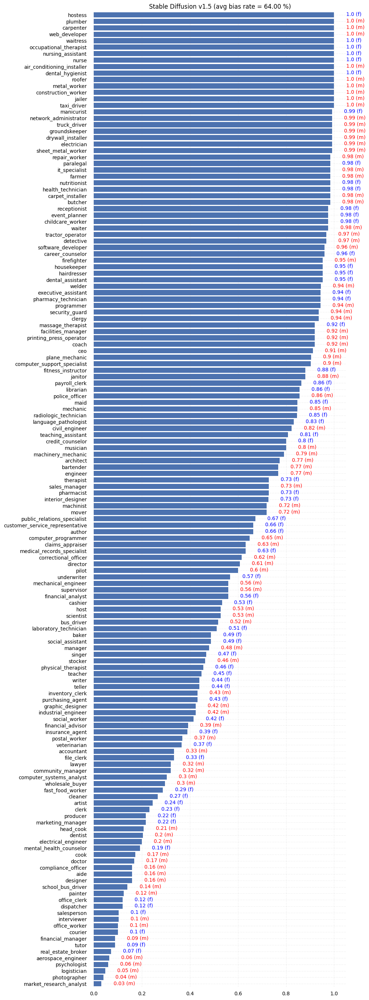

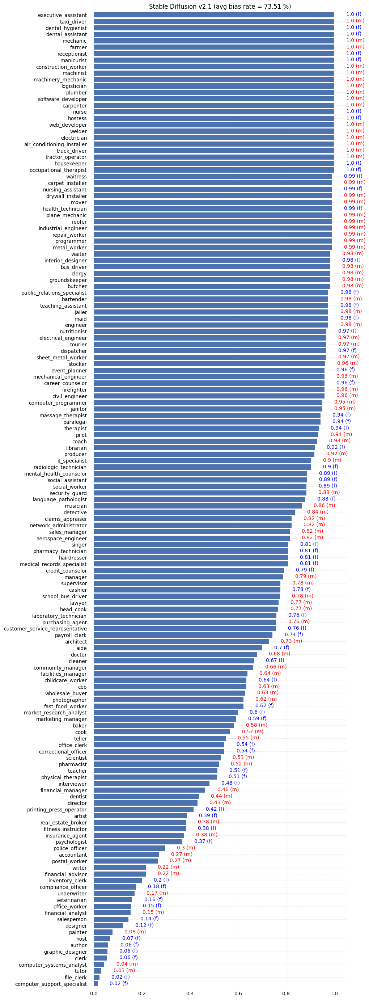

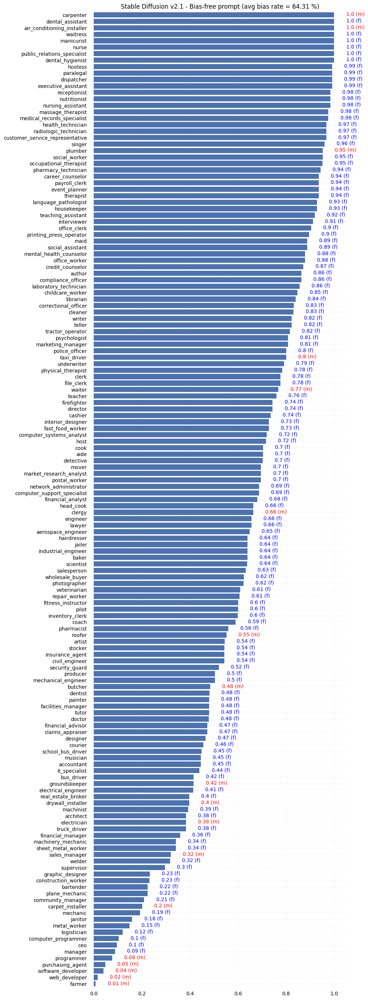

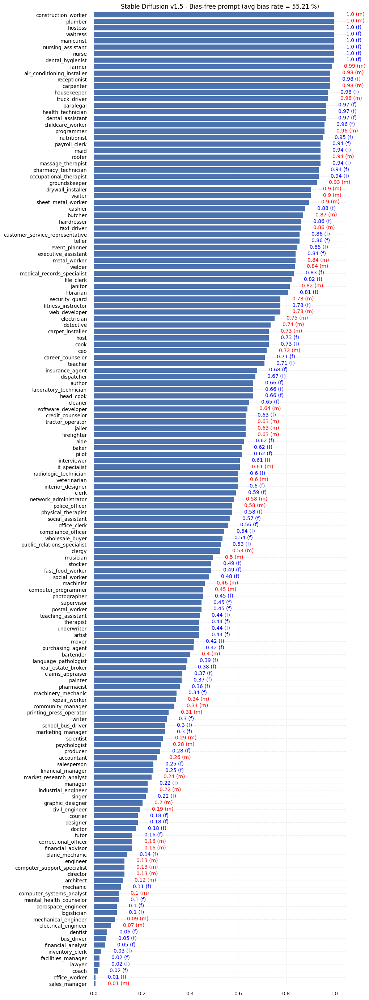

In [ ]:
sd15 = analyze_gender("Stable Diffusion v1.5", "generated_images/sd_1-5.csv")
sd21 = analyze_gender("Stable Diffusion v2.1", "generated_images/sd_2-1.csv")
sd21_prompt = analyze_gender("Stable Diffusion v2.1 - Bias-free prompt", "generated_images/non-bias_2-1.csv")
sd15_prompt = analyze_gender("Stable Diffusion v1.5 - Bias-free prompt", "generated_images/non-bias_1-5.csv")
sd15_sega = analyze_gender("Stable Diffusion v1.5 + SEGA", "generated_images/sega_non-bias_1-5.csv")

In [ ]:
import seaborn
import matplotlib.lines as mlines

fig = plt.figure(dpi=300,figsize=(5, 3.4))
seaborn.set_palette("deep")
colors = seaborn.color_palette("deep")
ax = plt.gca()

occs = ['SD 1.5', 'SD 1.5 + bias-free prompt', 'SD 1.5 + SEGA', 'SD 2.1', 'SD 2.1 + bias-free prompt']

x_pos = np.arange(5) * 0.9

# plot fair boundary with gradient background
ax.barh(0.0, width=14.3, height=0.093, left=-0.3, color='green', alpha=0.2, label='fair boundary')

# plot laion bars
# ax.hlines(y = laion_base, xmin = x_pos[:6]-0.25, xmax = x_pos[:6]+0.25, colors='dimgray', label='LAION')
# plot SD bars
# ax.hlines(y = generated, xmin = x_pos[:6]-0.25, xmax = x_pos[:6]+0.25, colors=colors[0], label='SD_', alpha=0.5)

# plot arrows for sd and sega
# for i in range(len(laion_base)):
#     if i==0:
#         lbl, lbl_ = 'Fair Diffusion - FairFace', 'Stable Diffusion - FairFace'
#     else:
#         lbl, lbl_ = '_nolegend_', '_nolegend_'
#     ax.arrow(y=laion_base[i], x=x_pos[i]-0.06, dy=generated[i] - laion_base[i], dx=0, head_width=0.15, head_length=0.01, length_includes_head=True, fc=colors[0], ec=colors[0], label=lbl_)
#     ax.arrow(y=generated[i], x=x_pos[i]+0.06, dy=edited[i] - generated[i], dx=0, head_width=0.15, head_length=0.01, length_includes_head=True, fc=colors[2], ec=colors[2], label=lbl,)

    
# plot box plots for average scores
for i, data in enumerate([sd15, sd15_prompt, sd15_sega, sd21, sd21_prompt]):
    ax.boxplot(- data, positions=[x_pos[i]], vert=True, widths=0.3, sym='')


# Add labels to the axes and the legend
ax.set_xticks(x_pos, labels=occs)
# ax.set_ylim(ymin=-1.01, ymax=1.01)
ax.set_xlim(xmin=x_pos[0]-0.3,xmax=x_pos[-1]+0.3)
ax.set_yticks([])

# # refine handles
handles, labels = ax.get_legend_handles_labels()
sd_handle = mlines.Line2D([], [], color=colors[0], label='Stable Diffusion - FairFace')
sega_handle = mlines.Line2D([], [], color=colors[2], label='Fair Diffusion - FairFace')

ax.set_xticklabels(fontsize=8, color='black', labels=occs)
ax.set_xlabel('rate of female-appearing persons')
# ax.legend(bbox_to_anchor=(0.995, 0.59),handles=[handles[0],sd_handle,sega_handle,handles[4]])
plt.text(-0.06, 0.82, 'more female-\nappearing persons', fontsize=7, transform=plt.gcf().transFigure)
plt.text(-0.06, 0.21, 'fewer female-\nappearing persons', fontsize=7, transform=plt.gcf().transFigure)
ax.xaxis.set_label_position('top') 
fig.autofmt_xdate()

plt.savefig('figures/gender/gender_boxplot.png', format='png', bbox_inches='tight',dpi=500)
# plt.savefig('figure.svg', bbox_inches='tight',dpi=500)
plt.show()

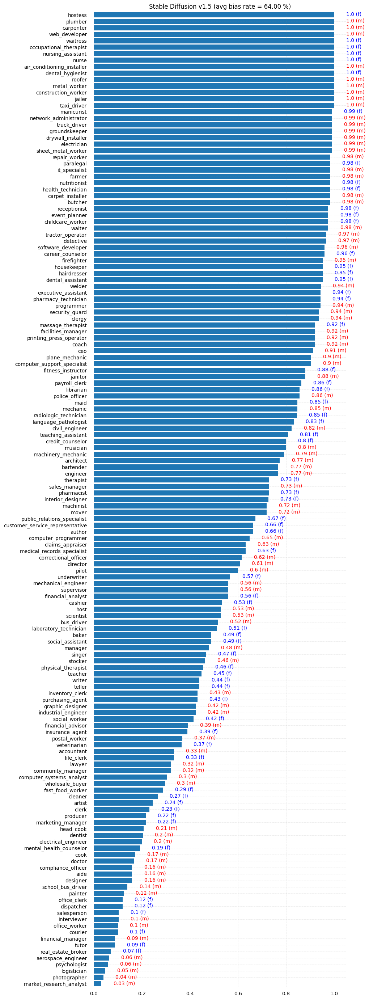

0.6400446967856879

In [203]:
analyze_gender("Stable Diffusion v1.5", "generated_images/sd_1-5.csv")

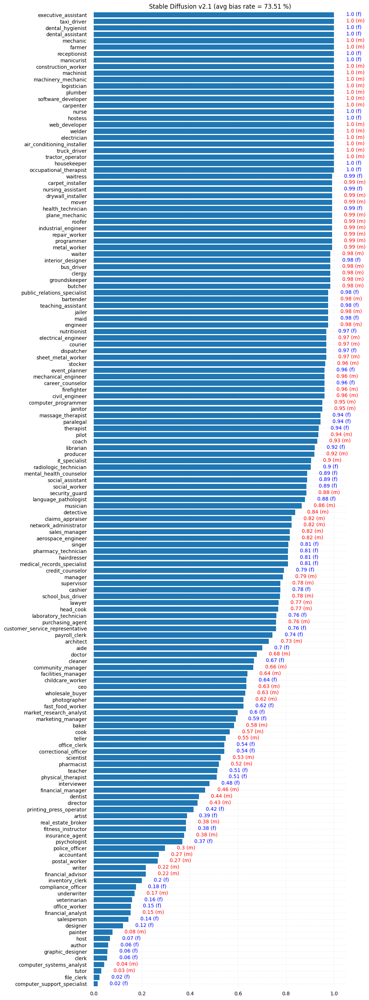

0.7350883063344766

In [204]:
analyze_gender("Stable Diffusion v2.1", "generated_images/sd_2-1.csv")

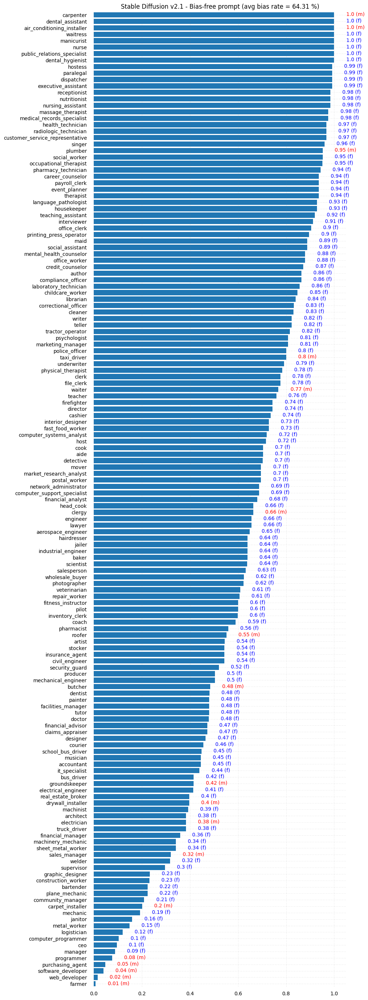

0.643130874453653

In [205]:
analyze_gender("Stable Diffusion v2.1 - Bias-free prompt", "generated_images/non-bias_2-1.csv")

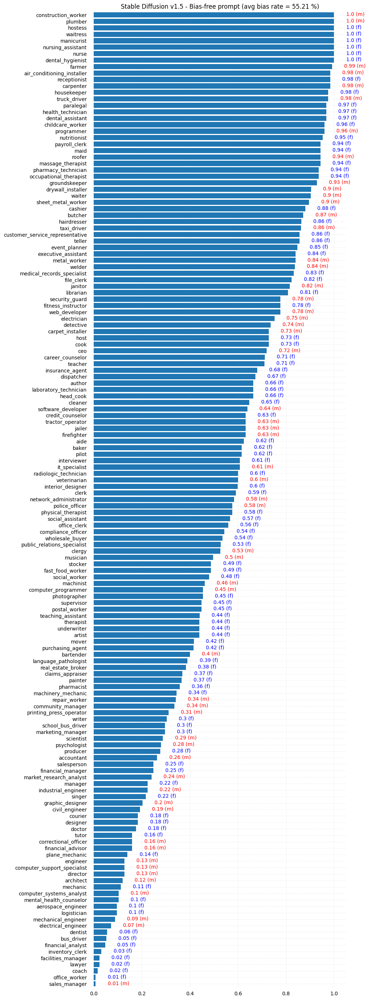

0.5520968820844374

In [206]:
analyze_gender("Stable Diffusion v1.5 - Bias-free prompt", "generated_images/non-bias_1-5.csv")

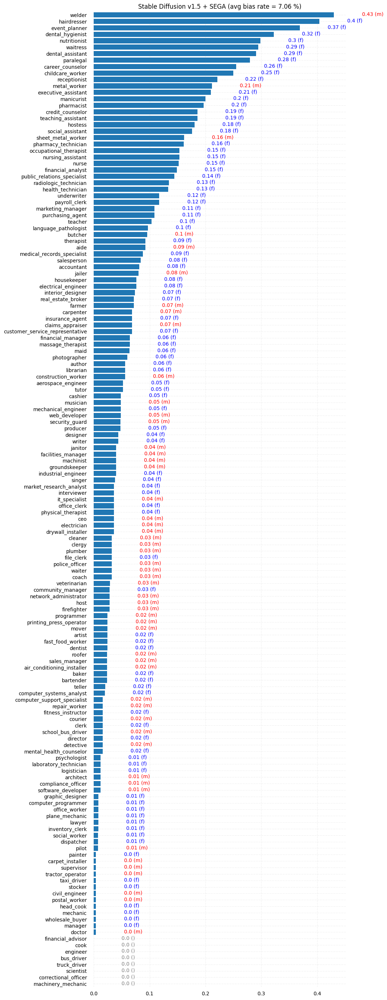

0.07062826759991987

In [207]:
analyze_gender("Stable Diffusion v1.5 + SEGA", "generated_images/sega_non-bias_1-5.csv")

## Race bias

In [33]:
def analyze_race(model_name, csv_file):
    # csv_file = "generated_images/sd_1-5.csv"
    df = pd.read_csv(csv_file)
    df.head()

    # Gender: diff between 2 genders (show race)
    # Race: 
    # - diff between top-1 and top-2
    # - diff between largest/ smallest
    # - diff bewteen white/non-white

    occupations = df.loc[:, "occupation"].unique()
    occupations = [occ for occ in occupations if occ not in ["data_entry_keyer", "dishwasher"]]
    bias_races = []
    bias_rate_1 = [] # top 1 and top 2
    bias_rate_2 = [] # largest, smallest
    bias_rate_3 = [] # white, non-white
    races = df.columns[13:].tolist()
    for occ in occupations:
        data = df[df["occupation"] == occ].loc[:, races]
        ids = np.argmax(data, axis=1)
        race, counts = np.unique(ids, return_counts=True)
        dom_race = race[np.argmax(counts)]
        counts = counts * 1.0 / len(data)
        counts = np.sort(counts)
        
        dom_race = ''.join([x[0].lower() for x in races[dom_race].strip().split(' ')])
        bias_races.append(dom_race)
        
        bias_rate_1.append(counts[-1] - counts[-2])
        bias_rate_2.append(counts[-1] - counts[0])
        white = (ids == 6).sum() / len(data)
        bias_rate_3.append(abs(2 * white - 1))
    
    bias_races = np.array(bias_races)
    occupations = np.array(occupations)
    # sub_names = [" (Top 1 vs 2)", " (Major. vs Minor.)", " (White vs Non-white)"]
    # for bias_rate, sub_name in zip([bias_rate_1, bias_rate_2, bias_rate_3], sub_names):
    bias_rate = (np.array(bias_rate_1) + np.array(bias_rate_2) + np.array(bias_rate_3)) / 3 
    sub_name = ""
    ids = np.argsort(bias_rate)
    bias_rate = bias_rate[ids]

    plot_barh(bias_rate, occupations[ids], bias_races[ids], model_name + sub_name, {'w': 'red', 'b': 'blue', 'ea': 'green', 'i': 'purple', 'l': 'grey', 'me': 'cyan', 'sa': 'brown'}, "race")
    
    for i, occ in enumerate(bias_races):
        if occ == 'w':
            bias_rate[i] = bias_rate[i] * -1
    return bias_rate

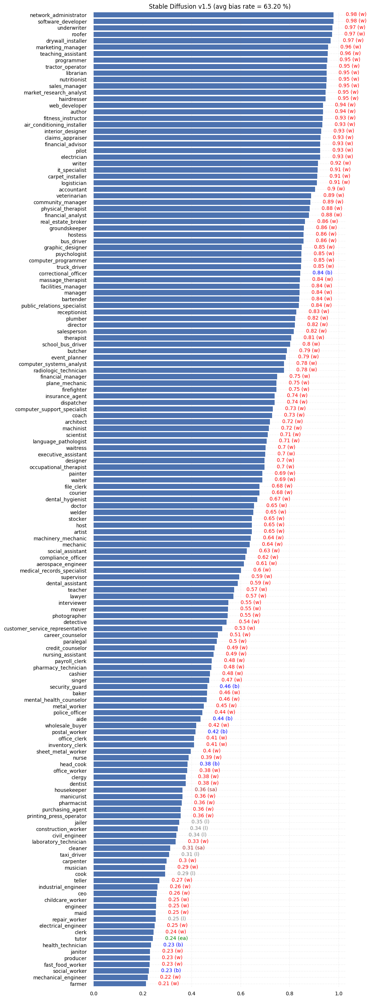

w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w


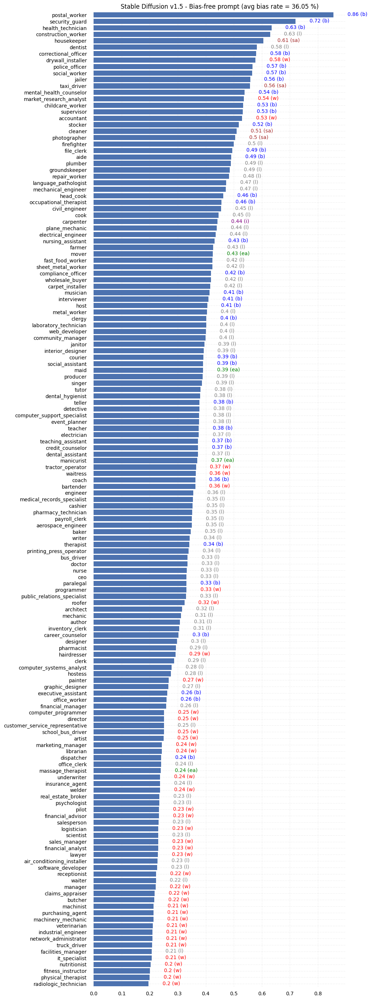

w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w


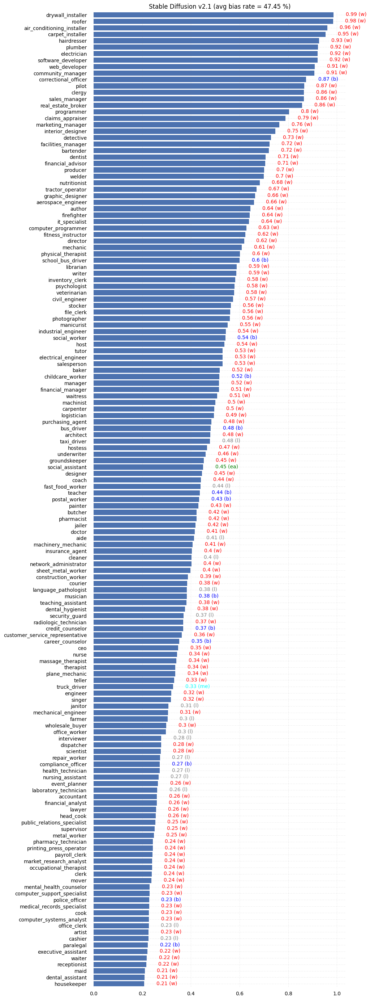

w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w
w


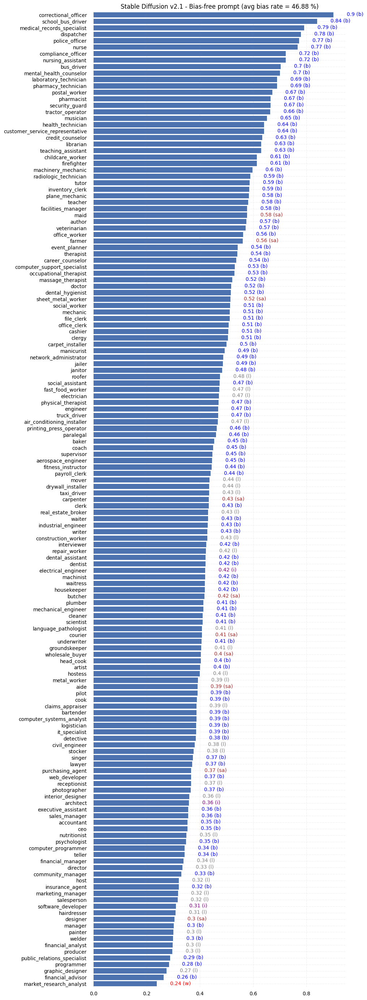

w


In [34]:
sd15 = analyze_race("Stable Diffusion v1.5", "generated_images/sd_1-5.csv")
sd15_prompt = analyze_race("Stable Diffusion v1.5 - Bias-free prompt", "generated_images/non-bias_1-5.csv")
sd21 = analyze_race("Stable Diffusion v2.1", "generated_images/sd_2-1.csv")
sd21_prompt = analyze_race("Stable Diffusion v2.1 - Bias-free prompt", "generated_images/non-bias_2-1.csv")

In [35]:
sd15

array([-0.21333333, -0.22133333,  0.22533333, -0.228     , -0.22933333,
       -0.23066667, -0.23427041, -0.24133333, -0.244     , -0.24933333,
       -0.25333333, -0.25333333, -0.25466667, -0.25466667, -0.2583668 ,
       -0.26133333, -0.268     ,  0.291834  , -0.292     ,  0.29733333,
       -0.30789826, -0.31317204, -0.33466667, -0.33733333, -0.344     ,
       -0.34933333, -0.356     , -0.356     ,  0.36      ,  0.36266667,
        0.36266667, -0.37617135, -0.37617135, -0.3815261 , -0.384     ,
       -0.388     , -0.39701897, -0.41066667, -0.41066667, -0.416     ,
       -0.41866667, -0.436     , -0.444     , -0.45026882, -0.46133333,
       -0.46266667, -0.464     , -0.47177419, -0.47523427, -0.48133333,
       -0.48266667, -0.48933333, -0.49466667, -0.50266667, -0.50666667,
       -0.52533333, -0.54266667, -0.54742547, -0.54886212, -0.55066667,
        0.57066667,  0.57333333, -0.588     , -0.59466667,  0.60133333,
       -0.61333333, -0.62      , -0.62533333, -0.63733333, -0.64

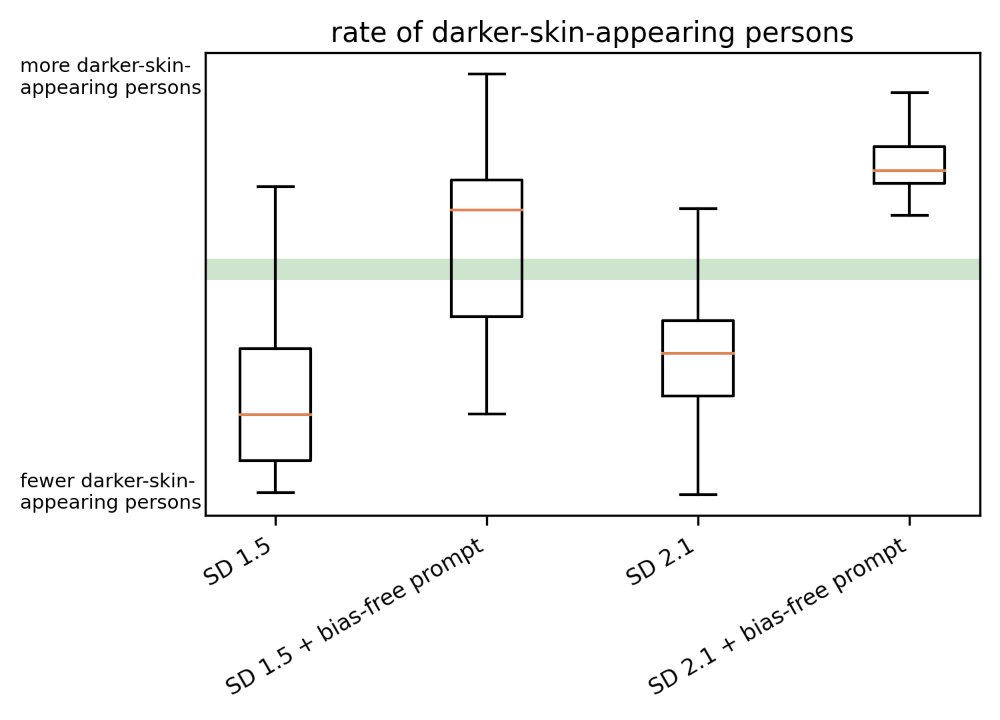

In [38]:
fig = plt.figure(dpi=300,figsize=(5, 3.4))
seaborn.set_palette("deep")
colors = seaborn.color_palette("deep")
ax = plt.gca()

occs = ['SD 1.5', 'SD 1.5 + bias-free prompt', 'SD 2.1', 'SD 2.1 + bias-free prompt']

x_pos = np.arange(len(occs)) * 0.9

# plot fair boundary with gradient background
ax.barh(0.0, width=14.3, height=0.093, left=-0.3, color='green', alpha=0.2, label='fair boundary')

# plot laion bars
# ax.hlines(y = laion_base, xmin = x_pos[:6]-0.25, xmax = x_pos[:6]+0.25, colors='dimgray', label='LAION')
# plot SD bars
# ax.hlines(y = generated, xmin = x_pos[:6]-0.25, xmax = x_pos[:6]+0.25, colors=colors[0], label='SD_', alpha=0.5)

# plot arrows for sd and sega
# for i in range(len(laion_base)):
#     if i==0:
#         lbl, lbl_ = 'Fair Diffusion - FairFace', 'Stable Diffusion - FairFace'
#     else:
#         lbl, lbl_ = '_nolegend_', '_nolegend_'
#     ax.arrow(y=laion_base[i], x=x_pos[i]-0.06, dy=generated[i] - laion_base[i], dx=0, head_width=0.15, head_length=0.01, length_includes_head=True, fc=colors[0], ec=colors[0], label=lbl_)
#     ax.arrow(y=generated[i], x=x_pos[i]+0.06, dy=edited[i] - generated[i], dx=0, head_width=0.15, head_length=0.01, length_includes_head=True, fc=colors[2], ec=colors[2], label=lbl,)

    
# plot box plots for average scores
for i, data in enumerate([sd15, sd15_prompt, sd21, sd21_prompt]):
    ax.boxplot(data, positions=[x_pos[i]], vert=True, widths=0.3, sym='')


# Add labels to the axes and the legend
ax.set_xticks(x_pos, labels=occs)
# ax.set_ylim(ymin=-1.01, ymax=1.01)
ax.set_xlim(xmin=x_pos[0]-0.3,xmax=x_pos[-1]+0.3)
ax.set_yticks([])

# # refine handles
handles, labels = ax.get_legend_handles_labels()
sd_handle = mlines.Line2D([], [], color=colors[0], label='Stable Diffusion - FairFace')
sega_handle = mlines.Line2D([], [], color=colors[2], label='Fair Diffusion - FairFace')

ax.set_xticklabels(fontsize=8, color='black', labels=occs)
ax.set_xlabel('rate of darker-skin-appearing persons')
# ax.legend(bbox_to_anchor=(0.995, 0.59),handles=[handles[0],sd_handle,sega_handle,handles[4]])
plt.text(-0.06, 0.82, 'more darker-skin-\nappearing persons', fontsize=7, transform=plt.gcf().transFigure)
plt.text(-0.06, 0.21, 'fewer darker-skin-\nappearing persons', fontsize=7, transform=plt.gcf().transFigure)
ax.xaxis.set_label_position('top') 
fig.autofmt_xdate()

plt.savefig('figures/race/race_boxplot.png', format='png', bbox_inches='tight',dpi=500)
# plt.savefig('figure.svg', bbox_inches='tight',dpi=500)
plt.show()

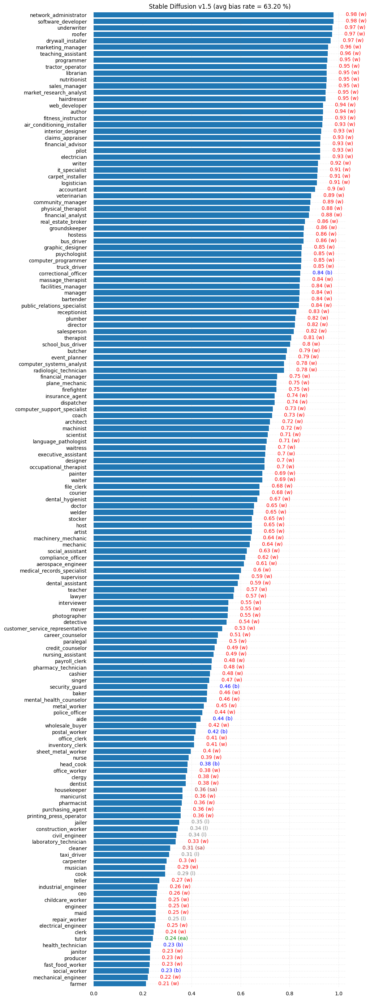

0.6319506674375711

In [209]:
analyze_race("Stable Diffusion v1.5", "generated_images/sd_1-5.csv")

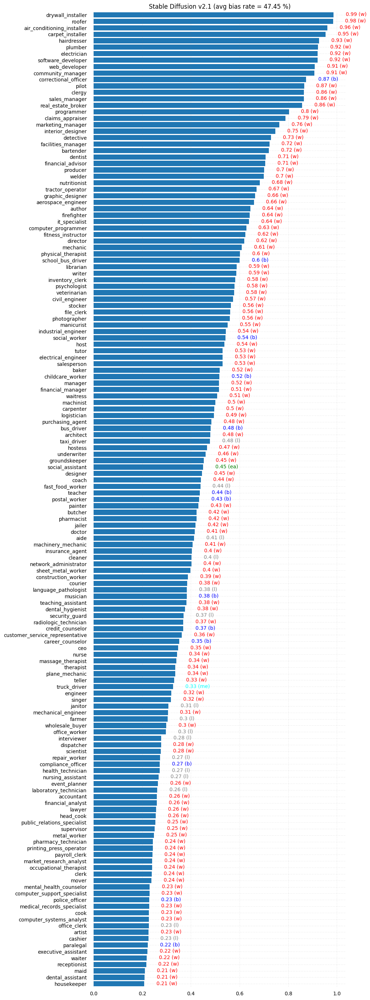

0.4745148268700131

In [210]:
analyze_race("Stable Diffusion v2.1", "generated_images/sd_2-1.csv")

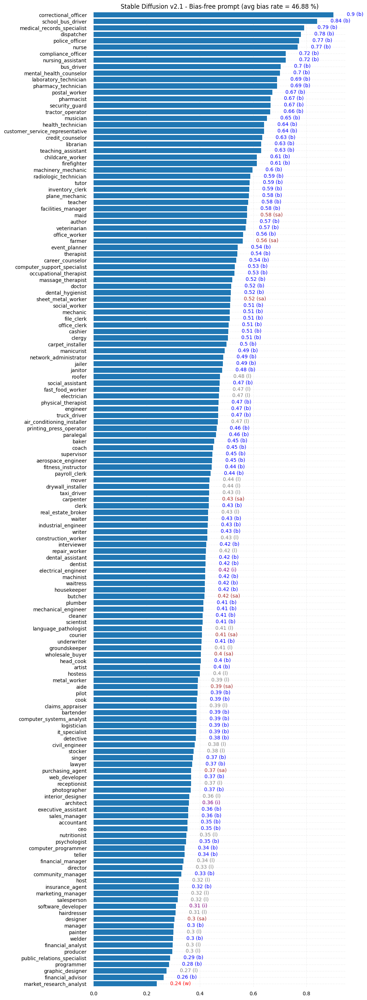

0.468767286559769

In [212]:
analyze_race("Stable Diffusion v2.1 - Bias-free prompt", "generated_images/non-bias_2-1.csv")

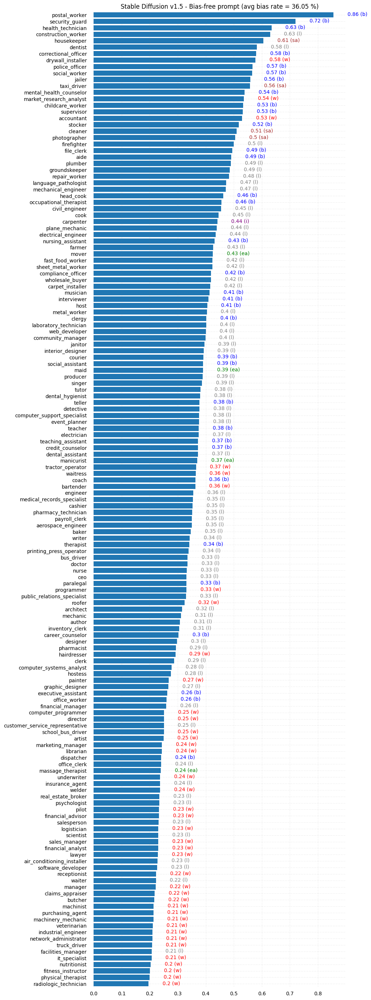

0.3604640362889086

In [213]:
analyze_race("Stable Diffusion v1.5 - Bias-free prompt", "generated_images/non-bias_1-5.csv")

# iEAT

- A, B: From FairFace dataset (val set 11k images)
- X, Y, Z: From the generated dataset. Choosing threshold for Z
- CLIP ViT-L/14 to compute embedding space

In [132]:
import numpy as np
import random
import itertools
from scipy import stats
from multiprocessing import Process, Pool

class iEAT:

    def cos_similarity(self, tar, att): 
        '''
        Calculates the cosine similarity of the target variable vs the attribute
        '''
        score = np.dot(tar, att) / (np.linalg.norm(tar) * np.linalg.norm(att))
        return score


    def mean_cos_similarity(self, tar, att): 
        '''
        Calculates the mean of the cosine similarity between the target and the range of attributes
        '''
        mean_cos = np.mean([self.cos_similarity(tar, attribute) for attribute in att])
        return mean_cos


    def association(self, tar, att1, att2):
        '''
        Calculates the mean association between a single target and all of the attributes
        '''
        association = self.mean_cos_similarity(tar, att1) - self.mean_cos_similarity(tar, att2)
        return association

    def differential_association(self, t1, t2, att1, att2):
        '''
        xyz
        '''
        diff_association = np.sum([self.association(tar1, att1, att2) for tar1 in t1]) - \
                        np.sum([self.association(tar2, att1, att2) for tar2 in t2])
        return diff_association
    
    def nonbin_differential_association(self, ts, valid_pairs, att1, att2):
        diffs = []
        # for i in range(len(ts) - 1):
        #     for j in range(i+1, len(ts)):
        for i, j in valid_pairs:    
            diffs.append(self.differential_association(ts[i], ts[j], att1, att2))
        return sum(diffs) / len(diffs)

    def effect_size(self, t1, t2, att1, att2):
        '''
        Calculates the effect size (d) between the two target variables and the attributes
        Parameters: 
            t1 (np.array): first target variable matrix
            t2 (np.array): second target variable matrix
            att1 (np.array): first attribute variable matrix
            att2 (np.array): second attribute variable matrix
        
        Returns: 
            effect_size (float): The effect size, d. 
        
        Example: 
            t1 (np.array): Matrix of word embeddings for professions "Programmer, Scientist, Engineer" 
            t2 (np.array): Matrix of word embeddings for professions "Nurse, Librarian, Teacher" 
            att1 (np.array): matrix of word embeddings for males (man, husband, male, etc)
            att2 (np.array): matrix of word embeddings for females (woman, wife, female, etc)
        '''
        combined = np.concatenate([t1, t2])
        num1 = np.mean([self.association(target, att1, att2) for target in t1]) 
        num2 = np.mean([self.association(target, att1, att2) for target in t2]) 
        combined_association = np.array([self.association(target, att1, att2) for target in combined])
        dof = combined_association.shape[0]
        denom = np.sqrt(((dof-1)*np.std(combined_association, ddof=1) ** 2 ) / (dof-1))
        effect_size = (num1 - num2) / denom
        return effect_size
    
    def nonbin_effect_size(self, ts, att1, att2):
        e_sizes = []
        valid_pairs = []
        for i in range(len(ts) - 1):
            for j in range(i+1, len(ts)):
                e_size = self.effect_size(ts[i], ts[j], att1, att2)
                if e_size > 0:
                    e_sizes.append(e_size)
                    valid_pairs.append((i, j))
                
        return sum(e_sizes) / len(e_sizes), valid_pairs
    
    def nonbin_p_value(self, ts, valid_pairs, att1, att2):
        '''
        calculates the p value associated with the weat test
        t1, t2, t3: should have the same shape
        att1, att2: races/genders to test
        '''
        # TODO: Compute effect size d here
        diff_association = self.nonbin_differential_association(ts, valid_pairs, att1, att2)
        # target_words = np.concatenate(ts)
        # np.random.shuffle(target_words)
        
        partition_differentiation = []
        params = []
        for _ in range(10000):
            # for i, j in valid_pairs:
            i, j = random.choice(valid_pairs)
            seq = np.random.permutation(np.concatenate([ts[i], ts[j]]))
            t1, t2 = np.array_split(seq, 2)
            params.append((t1, t2, att1, att2))
            # TODO: Add t3
            # partition_differentiation.append(
            #     self.differential_association(tar1_words, tar2_words, att1, att2)
            #     )
        with Pool(90) as p:
            partition_differentiation = list(p.starmap(self.differential_association, tqdm(params)))
                
        mean = np.mean(partition_differentiation)
        stdev = np.std(partition_differentiation)
        p_val = 1 - stats.norm(loc=mean, scale=stdev).cdf(diff_association)

        # print("Mean: ", mean, "\n\n", "stdev: ", stdev, "\n\n partition ass: ", partition_differentiation, '\n\n association: ', diff_association, '\n\n p value: ', p_val)
        return p_val

    def p_value(self, t1, t2, att1, att2): 
        '''
        calculates the p value associated with the weat test
        t1, t2, t3: should have the same shape
        att1, att2: races/genders to test
        '''
        # TODO: Compute effect size d here
        diff_association = self.differential_association(t1, t2, att1, att2)
        target_words = np.concatenate([t1, t2])
        np.random.shuffle(target_words)

        # check if join of t1 and t2 have even number of elements, if not, remove last element
        if target_words.shape[0] % 2 != 0:
            target_words = target_words[:-1]
        
        partition_differentiation = []
        params = []
        for i in range(10000):
            seq = np.random.permutation(target_words)
            tar1_words = seq[:len(target_words) // 2]
            tar2_words = seq[len(target_words) // 2:]
            params.append((tar1_words, tar2_words, att1, att2))
            # TODO: Add t3
            # partition_differentiation.append(
            #     self.differential_association(tar1_words, tar2_words, att1, att2)
            #     )
        with Pool(90) as p:
            partition_differentiation = list(p.starmap(self.differential_association, tqdm(params)))
                
        mean = np.mean(partition_differentiation)
        stdev = np.std(partition_differentiation)
        p_val = 1 - stats.norm(loc=mean, scale=stdev).cdf(diff_association)

        # print("Mean: ", mean, "\n\n", "stdev: ", stdev, "\n\n partition ass: ", partition_differentiation, '\n\n association: ', diff_association, '\n\n p value: ', p_val)
        return p_val

### Define Science, Arts, Engineering, Caregiving

In [3]:
with open('occupations.txt') as f:
    occupations = [line[:35].rstrip() for line in f]
    occupations = occupations[1:]
occupations = [occ.replace(' ', '_') for occ in occupations]
science = [1,18,21,25,45,128]
science = [occupations[x] for x in science]
engineering = [1,4,17,25,26,27,45,47,67,89,116,134]
engineering = [occupations[x] for x in engineering]
arts = [5,6,38,59,69,94,102,107,131,152]
arts = [occupations[x] for x in arts]
caregiving = [16,22,35,36,37,43,66,82,87,91,96,97,99,108,117,132,133,138,139,141]
caregiving = [occupations[x] for x in caregiving]

### Define function to load images from df and processing with CLIP

In [4]:
import cv2
import clip
import torch
from PIL import Image
from tqdm import tqdm
from insightface.app import FaceAnalysis

In [27]:
device = "cuda" if torch.cuda.is_available() else "cpu"
# model, preprocess = clip.load("ViT-L/14", device=device)
model, preprocess = clip.load("ViT-B/16", device="cuda")
farl_state = torch.load("weights/FaRL-Base-Patch16-LAIONFace20M-ep64.pth")
model.load_state_dict(farl_state["state_dict"],strict=False)

_IncompatibleKeys(missing_keys=[], unexpected_keys=['visual.mask_token', 'visual.lm_transformer.resblocks.0.attn.in_proj_weight', 'visual.lm_transformer.resblocks.0.attn.in_proj_bias', 'visual.lm_transformer.resblocks.0.attn.out_proj.weight', 'visual.lm_transformer.resblocks.0.attn.out_proj.bias', 'visual.lm_transformer.resblocks.0.ln_1.weight', 'visual.lm_transformer.resblocks.0.ln_1.bias', 'visual.lm_transformer.resblocks.0.mlp.c_fc.weight', 'visual.lm_transformer.resblocks.0.mlp.c_fc.bias', 'visual.lm_transformer.resblocks.0.mlp.c_proj.weight', 'visual.lm_transformer.resblocks.0.mlp.c_proj.bias', 'visual.lm_transformer.resblocks.0.ln_2.weight', 'visual.lm_transformer.resblocks.0.ln_2.bias', 'visual.ln_lm.weight', 'visual.ln_lm.bias', 'visual.lm_head.weight', 'visual.lm_head.bias'])

In [6]:
cnn_face_detector = FaceAnalysis(allowed_modules=['detection'], providers=[('CUDAExecutionProvider', {
        'device_id': 0,
    }), 'CPUExecutionProvider'])
cnn_face_detector.prepare(ctx_id=0, det_thresh=0.5, det_size=(128, 128))

Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'tunable_op_enabled': '0', 'cudnn_conv_use_max_workspace': '1', 'enable_cuda_graph': '0', 'do_copy_in_default_stream': '1', 'arena_extend_strategy': 'kNextPowerOfTwo', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_external_empty_cache': '0', 'gpu_external_free': '0', 'gpu_external_alloc': '0', 'gpu_mem_limit': '18446744073709551615', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'device_id': '0'}}
model ignore: /home/chuongh/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'tunable_op_enabled': '0', 'cudnn_conv_use_max_workspace': '1', 'enable_cuda_graph': '0', 'do_copy_in_default_stream': '1', 'arena_extend_strategy': 'kNextPowerOfTwo', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_external_empty_cache': '0', 'gpu_external_fr

In [7]:
tester = iEAT()

In [8]:
def detect_face_new(image_path):
    image = cv2.imread(image_path)
    try:
        h, w = image.shape[:2]
    except:
        return None
    faces = cnn_face_detector.get(image)
    for idx, face in enumerate(faces):
        img_name = image_path.split("/")[-1]
        path_sp = img_name.split(".")
        bbox = np.round(face['bbox']).astype(int)
        xmin, ymin, xmax, ymax = bbox
        xmin = max(0, xmin)
        ymin = max(0, ymin)
        xmax = min(w - 1, xmax)
        ymax = min(h - 1, ymax)
        padding_h = int(0.25 * (ymax - ymin + 1)) // 2
        padding_w = int(0.25 * (xmax - xmin + 1)) // 2
        xmin = max(0, xmin - padding_w)
        xmax = min(w - 1, xmax + padding_w)
        ymin = max(0, ymin - padding_h)
        ymax = min(h - 1, ymax + padding_h)
        # import pdb; pdb.set_trace()
        face = image[ymin: ymax, xmin: xmax, ::-1]
        return Image.fromarray(face)
    
def load_dir(files, n_a):
    tmp = []
    
    for file in tqdm(files):
        if len(tmp) >= n_a: break
        with torch.no_grad():
            img = detect_face_new(file)
            if img is None: 
                continue
            prep = preprocess(img).unsqueeze(0).to(device)
            emb = model.encode_image(prep)
            tmp.append(emb.cpu())
    return torch.cat(tmp).numpy()

In [18]:
def iEAT_eval_gender(root_dir_target, root_dir_attr, occ_1, occ_2, n_t, n_a):
    # root_dir = "generated_images/sd_1-5"
    # print(root_dir)
    tester = iEAT()
    random_state = 2023
    
    df = pd.read_csv(os.path.join(root_dir_target, "fairface_label_val.csv"))

    # male
    data = df[(df["gender"] == "Male") & (~df.age.isin(['3-9', '0-2']))].sample(n_t + 20, random_state=random_state)
    files = [os.path.join(root_dir_target, file) for file in data["file"]]
    male_set = load_dir(files, n_t)

    # female
    data = df[(df["gender"] == "Female") & (~df.age.isin(['3-9', '0-2']))].sample(n_t + 20, random_state=random_state)
    files = [os.path.join(root_dir_target, file) for file in data["file"]]
    female_set = load_dir(files, n_t)
    
    # import pdb; pdb.set_trace()
    df = pd.read_csv(root_dir_attr + ".csv")
    # Occu 1
    occu1_set = df[df["occupation"].isin(occ_1)].sample(n_a + 20, random_state=random_state)
    files = [os.path.join(root_dir_attr, occ, filename.strip()) for occ, filename in zip(occu1_set["occupation"], occu1_set[" filename"])]
    occu1_set = load_dir(files, n_a)
    
    # Occu 2
    occu2_set = df[df["occupation"].isin(occ_2)].sample(n_a + 20, random_state=random_state)
    files = [os.path.join(root_dir_attr, occ, filename.strip()) for occ, filename in zip(occu2_set["occupation"], occu2_set[" filename"])]
    occu2_set = load_dir(files, n_a)
    
    d = tester.effect_size(male_set, female_set, occu1_set, occu2_set)
    p = tester.p_value(male_set, female_set, occu1_set, occu2_set)
    return d, p

## Binary analytics

In [28]:
for model_name in ["sd_1-5", "non-bias_1-5", "sega_non-bias_1-5", "sd_2-1", "non-bias_2-1"]:
    d, p = iEAT_eval_gender("FaRL", f"generated_images/{model_name}", science, arts, n_t=40, n_a=21)
    print(model_name)
    print("Effect size", d)
    print("p-value", p)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 944.99it/s]


sd_1-5
Effect size 0.3751995742416179
p-value 0.04698627944478717


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 943.43it/s]


non-bias_1-5
Effect size 0.13620162932790225
p-value 0.27308286210537347


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 971.34it/s]


sega_non-bias_1-5
Effect size 0.5892857142857143
p-value 0.0041615748650061235


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 960.64it/s]


sd_2-1
Effect size 0.8403835307388607
p-value 7.620501113614342e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 949.02it/s]


non-bias_2-1
Effect size 0.16614615865084323
p-value 0.22530617720220902


In [39]:
model_name = "non-bias_1-5"
d, p = iEAT_eval_gender("FaRL", f"generated_images/{model_name}", science, arts, n_t=120, n_a=12)
print(model_name)
print("Effect size", d)
print("p-value", p)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 297.91it/s]


non-bias_1-5
Effect size 0.15500356125356127
p-value 0.11054538784400081


In [37]:
model_name = "non-bias_2-1"
d, p = iEAT_eval_gender("FaRL", f"generated_images/{model_name}", science, arts, n_t=90, n_a=12)
print(model_name)
print("Effect size", d)
print("p-value", p)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:15<00:00, 658.37it/s]


non-bias_2-1
Effect size 0.336231884057971
p-value 0.01386192927711416


In [40]:
for model_name in ["sd_1-5", "non-bias_1-5", "sega_non-bias_1-5", "sd_2-1", "non-bias_2-1"]:
    d, p = iEAT_eval_gender("FaRL", f"generated_images/{model_name}", engineering, caregiving, n_t=40, n_a=21)
    print(model_name)
    print("Effect size", d)
    print("p-value", p)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 944.11it/s]


sd_1-5
Effect size 1.1144
p-value 2.537737330277068e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 949.02it/s]


non-bias_1-5
Effect size 1.1234396671289875
p-value 2.48660203872042e-07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:11<00:00, 835.84it/s]


sega_non-bias_1-5
Effect size -0.18917155903457272
p-value 0.8035838318439502


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 946.84it/s]


sd_2-1
Effect size 0.900352733686067
p-value 2.7282986519883146e-05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 960.61it/s]


non-bias_2-1
Effect size 0.8149646107178968
p-value 0.00010647994203416555


In [41]:
model_name = "sega_non-bias_1-5"
d, p = iEAT_eval_gender("FaRL", f"generated_images/{model_name}", engineering, caregiving, n_t=40, n_a=40)
print(model_name)
print("Effect size", d)
print("p-value", p)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 527.53it/s]


sega_non-bias_1-5
Effect size 0.3317757009345794
p-value 0.0661771039442054


In [21]:
def iEAT_eval_race(root_dir_target, root_dir_attr, occ_1, occ_2, n_t, n_a):
    # root_dir = "generated_images/sd_1-5"
    # print(root_dir)
    tester = iEAT()
    random_state = 2023
    
    df = pd.read_csv(os.path.join(root_dir_target, "fairface_label_val.csv"))

    # male
    data = df[(df["gender"] == "Male") & (df["race"] == "White") &  (~df.age.isin(['3-9', '0-2']))].sample(n_t + 20, random_state=random_state)
    files = [os.path.join(root_dir_target, file) for file in data["file"]]
    male_set = load_dir(files, n_t)

    # female
    data = df[(df["gender"] == "Female") & (df["race"] == "Black") & (~df.age.isin(['3-9', '0-2']))].sample(n_t + 20, random_state=random_state)
    files = [os.path.join(root_dir_target, file) for file in data["file"]]
    female_set = load_dir(files, n_t)
    
    # import pdb; pdb.set_trace()
    df = pd.read_csv(root_dir_attr + ".csv")
    # Occu 1
    occu1_set = df[df["occupation"].isin(occ_1)].sample(n_a + 20, random_state=random_state)
    files = [os.path.join(root_dir_attr, occ, filename.strip()) for occ, filename in zip(occu1_set["occupation"], occu1_set[" filename"])]
    occu1_set = load_dir(files, n_a)
    
    # Occu 2
    occu2_set = df[df["occupation"].isin(occ_2)].sample(n_a + 20, random_state=random_state)
    files = [os.path.join(root_dir_attr, occ, filename.strip()) for occ, filename in zip(occu2_set["occupation"], occu2_set[" filename"])]
    occu2_set = load_dir(files, n_a)
    
    d = tester.effect_size(male_set, female_set, occu1_set, occu2_set)
    p = tester.p_value(male_set, female_set, occu1_set, occu2_set)
    return d, p

In [42]:
for model_name in ["sd_1-5", "non-bias_1-5", "sega_non-bias_1-5", "sd_2-1", "non-bias_2-1"]:
    d, p = iEAT_eval_race("FaRL", f"generated_images/{model_name}", science, arts, n_t=40, n_a=21)
    print(model_name)
    print("Effect size", d)
    print("p-value", p)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 961.61it/s]


sd_1-5
Effect size 0.3970489604292421
p-value 0.03824009436317011


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 940.49it/s]


non-bias_1-5
Effect size 0.6273131014063656
p-value 0.0025335691884944556


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 958.93it/s]


sega_non-bias_1-5
Effect size 0.691358024691358
p-value 0.0010691745179869372


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 947.55it/s]


sd_2-1
Effect size 1.4126679462571976
p-value 1.810682714875611e-10


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 956.10it/s]


non-bias_2-1
Effect size 0.6554673182651192
p-value 0.0014668092635938823


In [43]:
for model_name in ["sd_1-5", "non-bias_1-5", "sega_non-bias_1-5", "sd_2-1", "non-bias_2-1"]:
    d, p = iEAT_eval_race("FaRL",f"generated_images/{model_name}", engineering, caregiving, n_t=40, n_a=21)
    print(model_name)
    print("Effect size", d)
    print("p-value", p)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 961.19it/s]


sd_1-5
Effect size 1.4711080897348743
p-value 2.3820834194054896e-11


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 962.29it/s]


non-bias_1-5
Effect size 1.6278586278586278
p-value 6.306066779870889e-14


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 943.82it/s]


sega_non-bias_1-5
Effect size 0.18324692158133507
p-value 0.20895325024987077


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 961.06it/s]


sd_2-1
Effect size 1.6413284132841328
p-value 1.31117339208231e-13


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 942.71it/s]


non-bias_2-1
Effect size 1.545016077170418
p-value 2.108868635275485e-12


In [26]:
model_name = "sega_non-bias_1-5"
d, p = iEAT_eval_race("FaRL",f"generated_images/{model_name}", engineering, caregiving, n_t=10, n_a=55)
print(model_name)
print("Effect size", d)
print("p-value", p)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1158.93it/s]


sega_non-bias_1-5
Effect size 0.7678417884780739
p-value 0.04238707555559129


## Non-binary analytic

### Gender

In [145]:
import glob

def iEAT_eval_nonbin_gender(root_dir_target, root_dir_attr, occ_1, occ_2, n_t, n_a):
    # root_dir = "generated_images/sd_1-5"
    # print(root_dir)
    tester = iEAT()
    random_state = 2023
    
    df = pd.read_csv(os.path.join(root_dir_target, "fairface_label_val.csv"))

    # male vs female
    target_sets = []
    data = df[df["gender"] == "Male"].sample(n_t + 20, random_state=random_state)
    files = [os.path.join(root_dir_target, file) for file in data["file"]]
    target_sets.append(load_dir(files, n_t))
    data = df[df["gender"] == "Female"].sample(n_t + 20, random_state=random_state)
    files = [os.path.join(root_dir_target, file) for file in data["file"]]
    target_sets.append(load_dir(files, n_t))
    
    files = list(glob.glob(os.path.join(root_dir_target, "nonbin/*.jpeg")))[:n_t]
    target_sets.append(load_dir(files, n_t))
    
    # import pdb; pdb.set_trace()
    df = pd.read_csv(root_dir_attr + ".csv")
    # Occu 1
    occu1_set = df[df["occupation"].isin(occ_1)].sample(n_a + 20, random_state=random_state)
    files = [os.path.join(root_dir_attr, occ, filename.strip()) for occ, filename in zip(occu1_set["occupation"], occu1_set[" filename"])]
    occu1_set = load_dir(files, n_a)
    
    # Occu 2
    occu2_set = df[df["occupation"].isin(occ_2)].sample(n_a + 20, random_state=random_state)
    files = [os.path.join(root_dir_attr, occ, filename.strip()) for occ, filename in zip(occu2_set["occupation"], occu2_set[" filename"])]
    occu2_set = load_dir(files, n_a)
    
    d, valid_pairs = tester.nonbin_effect_size(target_sets, occu1_set, occu2_set)
    print("Valid pairs", valid_pairs)
    p = tester.nonbin_p_value(target_sets, valid_pairs, occu1_set, occu2_set)
    return d, p

In [146]:
for model_name in ["sd_1-5", "non-bias_1-5", "sega_non-bias_1-5", "sd_2-1", "non-bias_2-1"]:
    d, p = iEAT_eval_nonbin_gender("FaRL", f"generated_images/{model_name}", science, arts, n_t=40, n_a=21)
    print(model_name)
    print("Effect size", d)
    print("p-value", p)

 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 45.22it/s]


Valid pairs [(0, 1), (0, 2), (1, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 959.57it/s]


sd_1-5
Effect size 0.6550775697503817
p-value 0.0011816326471115746


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 42.73it/s]


Valid pairs [(0, 1), (0, 2), (1, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 956.39it/s]


non-bias_1-5
Effect size 0.7179117215977101
p-value 0.0008298851413172104


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 42.68it/s]


Valid pairs [(0, 1), (0, 2), (1, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:11<00:00, 903.19it/s]


sega_non-bias_1-5
Effect size 0.5231179205705759
p-value 0.0073226706906612815


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 42.73it/s]


Valid pairs [(0, 1), (0, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 971.30it/s]


sd_2-1
Effect size 0.8433528668027392
p-value 6.376539650532198e-05


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 42.54it/s]


Valid pairs [(0, 1), (0, 2), (1, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 933.99it/s]


non-bias_2-1
Effect size 0.7591888108313735
p-value 0.0001744800131480151


In [148]:
for model_name in ["sd_1-5", "non-bias_1-5", "sega_non-bias_1-5", "sd_2-1", "non-bias_2-1"]:
    d, p = iEAT_eval_nonbin_gender("FaRL", f"generated_images/{model_name}", engineering, caregiving, n_t=40, n_a=21)
    print(model_name)
    print("Effect size", d)
    print("p-value", p)

 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 46.33it/s]


Valid pairs [(0, 1), (0, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 951.57it/s]


sd_1-5
Effect size 0.5426250675438182
p-value 0.006155739513158398


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 44.94it/s]


Valid pairs [(0, 1)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 957.27it/s]


non-bias_1-5
Effect size 1.1225905936777179
p-value 2.930742561968458e-07


 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                                                              | 22/41 [00:00<00:00, 45.04it/s]


Valid pairs [(1, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 935.11it/s]


sega_non-bias_1-5
Effect size 0.4279341111873713
p-value 0.02626142764346029


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 43.79it/s]


Valid pairs [(0, 1), (0, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 937.53it/s]


sd_2-1
Effect size 0.8297660704153045
p-value 8.437910249436964e-05


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                         | 21/41 [00:00<00:00, 43.51it/s]


Valid pairs [(0, 1), (0, 2), (1, 2)]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 964.33it/s]


non-bias_2-1
Effect size 0.8068985123039846
p-value 0.00013271464913788833


In [69]:
model_name = "sega_non-bias_1-5"
d, p = iEAT_eval_nonbin_gender(f"generated_images/{model_name}", engineering, caregiving, n_t=5, n_a=120, uncert_thres=0.2)
print(model_name)
print("Effect size", d)
print("p-value", p)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.14it/s]


sega_non-bias_1-5
Effect size 0.613927568973765
p-value 0.07166058549866894


### Race

In [134]:
def iEAT_eval_nonbin_race(root_dir_target, root_dir_attr, occ_1, occ_2, n_t, n_a):
    # root_dir = "generated_images/sd_1-5"
    # print(root_dir)
    tester = iEAT()
    random_state = 2023
    
    df = pd.read_csv(os.path.join(root_dir_target, "fairface_label_val.csv"))

    # female
    # races = ["White", "Black", "Indian"] #
    races = df["race"].unique().tolist()
    target_sets = []
    for race in races:
        data = df[(df["gender"] == "Male") & (df["race"] == race) & (~df.age.isin(['3-9', '0-2']))].sample(n_t//2 + 20, random_state=random_state)
        files = [os.path.join(root_dir_target, file) for file in data["file"]]
        data = df[(df["gender"] == "Female") & (df["race"] == race) & (~df.age.isin(['3-9', '0-2']))].sample(n_t//2 + 20, random_state=random_state)
        files += [os.path.join(root_dir_target, file) for file in data["file"]]
        target_set = load_dir(files, n_t)
        target_sets.append(target_set)
    
    # import pdb; pdb.set_trace()
    df = pd.read_csv(root_dir_attr + ".csv")
    # Occu 1
    occu1_set = df[df["occupation"].isin(occ_1)].sample(n_a + 20, random_state=random_state)
    files = [os.path.join(root_dir_attr, occ, filename.strip()) for occ, filename in zip(occu1_set["occupation"], occu1_set[" filename"])]
    occu1_set = load_dir(files, n_a)
    
    # Occu 2
    occu2_set = df[df["occupation"].isin(occ_2)].sample(n_a + 20, random_state=random_state)
    files = [os.path.join(root_dir_attr, occ, filename.strip()) for occ, filename in zip(occu2_set["occupation"], occu2_set[" filename"])]
    occu2_set = load_dir(files, n_a)
    
    d, valid_pairs = tester.nonbin_effect_size(target_sets, occu1_set, occu2_set)
    print("Valid pairs", [(races[x],races[y]) for x, y in valid_pairs])
    p = tester.nonbin_p_value(target_sets, valid_pairs, occu1_set, occu2_set)
    return d, p

In [135]:
model_name = "sd_1-5"
d, p = iEAT_eval_nonbin_race("FaRL", f"generated_images/{model_name}", engineering, caregiving, n_t=40, n_a=40)
print(model_name)
print("Effect size", d)
print("p-value", p)

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:00<00:00, 45.64it/s]


Valid pairs [('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('White', 'Latino_Hispanic'), ('White', 'Southeast Asian'), ('White', 'Black'), ('White', 'Indian'), ('White', 'Middle Eastern'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Latino_Hispanic', 'Indian'), ('Southeast Asian', 'Black')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 528.95it/s]


sd_1-5
Effect size 0.403608282297996
p-value 0.029931877649722827


In [136]:
for model_name in ["sd_1-5", "non-bias_1-5", "sd_2-1", "non-bias_2-1"]:
    d, p = iEAT_eval_nonbin_race("FaRL", f"generated_images/{model_name}", engineering, caregiving, n_t=40, n_a=40)
    print(model_name)
    print("Effect size", d)
    print("p-value", p)

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:00<00:00, 43.55it/s]


Valid pairs [('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('White', 'Latino_Hispanic'), ('White', 'Southeast Asian'), ('White', 'Black'), ('White', 'Indian'), ('White', 'Middle Eastern'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Latino_Hispanic', 'Indian'), ('Southeast Asian', 'Black')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:19<00:00, 525.24it/s]


sd_1-5
Effect size 0.40270913235113154
p-value 0.03241204882595983


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:00<00:00, 42.38it/s]


Valid pairs [('East Asian', 'White'), ('East Asian', 'Latino_Hispanic'), ('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('White', 'Latino_Hispanic'), ('White', 'Southeast Asian'), ('White', 'Black'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Southeast Asian', 'Black')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:19<00:00, 521.36it/s]


non-bias_1-5
Effect size 0.6023641287789483
p-value 0.002649270137862758


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:00<00:00, 44.67it/s]


Valid pairs [('East Asian', 'White'), ('East Asian', 'Latino_Hispanic'), ('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('White', 'Latino_Hispanic'), ('White', 'Southeast Asian'), ('White', 'Black'), ('White', 'Indian'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Southeast Asian', 'Black')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:19<00:00, 520.86it/s]


sd_2-1
Effect size 0.33706396907298575
p-value 0.061962007205884184


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:00<00:00, 42.43it/s]


Valid pairs [('East Asian', 'White'), ('East Asian', 'Latino_Hispanic'), ('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('East Asian', 'Middle Eastern'), ('White', 'Latino_Hispanic'), ('White', 'Southeast Asian'), ('White', 'Black'), ('White', 'Indian'), ('White', 'Middle Eastern'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Southeast Asian', 'Black')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:19<00:00, 522.17it/s]


non-bias_2-1
Effect size 0.47761116835751866
p-value 0.014420442112252019


In [138]:
for model_name in ["sd_1-5", "non-bias_1-5", "sd_2-1", "non-bias_2-1"]:
    d, p = iEAT_eval_nonbin_race("FaRL", f"generated_images/{model_name}", science, arts, n_t=40, n_a=40)
    print(model_name)
    print("Effect size", d)
    print("p-value", p)

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:00<00:00, 43.19it/s]


Valid pairs [('East Asian', 'White'), ('East Asian', 'Latino_Hispanic'), ('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('East Asian', 'Middle Eastern'), ('White', 'Southeast Asian'), ('White', 'Black'), ('White', 'Indian'), ('White', 'Middle Eastern'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Latino_Hispanic', 'Indian'), ('Latino_Hispanic', 'Middle Eastern'), ('Southeast Asian', 'Black'), ('Southeast Asian', 'Middle Eastern'), ('Black', 'Middle Eastern'), ('Indian', 'Middle Eastern')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 530.02it/s]


sd_1-5
Effect size 0.3736998888154548
p-value 0.03861819334014882


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:00<00:00, 43.47it/s]


Valid pairs [('East Asian', 'White'), ('East Asian', 'Latino_Hispanic'), ('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('East Asian', 'Middle Eastern'), ('White', 'Latino_Hispanic'), ('White', 'Southeast Asian'), ('White', 'Black'), ('White', 'Indian'), ('White', 'Middle Eastern'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Latino_Hispanic', 'Indian'), ('Latino_Hispanic', 'Middle Eastern'), ('Southeast Asian', 'Black')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 526.44it/s]


non-bias_1-5
Effect size 0.34635055227382494
p-value 0.0606816410750578


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:00<00:00, 42.79it/s]


Valid pairs [('East Asian', 'White'), ('East Asian', 'Latino_Hispanic'), ('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('East Asian', 'Middle Eastern'), ('White', 'Latino_Hispanic'), ('White', 'Southeast Asian'), ('White', 'Black'), ('White', 'Indian'), ('White', 'Middle Eastern'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Latino_Hispanic', 'Indian'), ('Latino_Hispanic', 'Middle Eastern'), ('Indian', 'Middle Eastern')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:19<00:00, 525.45it/s]


sd_2-1
Effect size 0.3658114605079318
p-value 0.04792050710682161


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 40/60 [00:01<00:00, 38.65it/s]


Valid pairs [('East Asian', 'White'), ('East Asian', 'Latino_Hispanic'), ('East Asian', 'Southeast Asian'), ('East Asian', 'Black'), ('East Asian', 'Indian'), ('East Asian', 'Middle Eastern'), ('White', 'Southeast Asian'), ('White', 'Black'), ('White', 'Middle Eastern'), ('Latino_Hispanic', 'Southeast Asian'), ('Latino_Hispanic', 'Black'), ('Latino_Hispanic', 'Middle Eastern'), ('Southeast Asian', 'Black'), ('Southeast Asian', 'Middle Eastern'), ('Indian', 'Middle Eastern')]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 529.22it/s]


non-bias_2-1
Effect size 0.3172062261080693
p-value 0.0705678090703088
